In [3]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import os
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

In [1]:
 pip install tensorflow

   ---------------------------------------- 0.0/5.5 MB ? eta -:--:--
    --------------------------------------- 0.1/5.5 MB 3.5 MB/s eta 0:00:02
   -- ------------------------------------- 0.4/5.5 MB 5.1 MB/s eta 0:00:02
   ---- ----------------------------------- 0.6/5.5 MB 4.5 MB/s eta 0:00:02
   ------ --------------------------------- 1.0/5.5 MB 6.0 MB/s eta 0:00:01
   ------- -------------------------------- 1.1/5.5 MB 5.2 MB/s eta 0:00:01
   --------- ------------------------------ 1.3/5.5 MB 4.7 MB/s eta 0:00:01
   ---------- ----------------------------- 1.4/5.5 MB 4.4 MB/s eta 0:00:01
   ---------- ----------------------------- 1.4/5.5 MB 4.0 MB/s eta 0:00:02
   ------------ --------------------------- 1.7/5.5 MB 4.3 MB/s eta 0:00:01
   ------------ --------------------------- 1.8/5.5 MB 4.0 MB/s eta 0:00:01
   ------------- -------------------------- 1.8/5.5 MB 4.0 MB/s eta 0:00:01
   --------------- ------------------------ 2.1/5.5 MB 4.0 MB/s eta 0:00:01
   ----------------

In [41]:
from PIL import Image
import glob
image_list = []
for filename in glob.glob(r"C:\Users\rng8...\monet_jpg\*.jpg"): 
    im=cv2.imread(filename)
    image_list.append(im)

In [42]:
image_list[1].shape

(256, 256, 3)

In [43]:
monet_images = np.array(image_list)


In [44]:
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(monet_images).shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)

In [45]:
tf.random.set_seed(42)
tf.keras.backend.clear_session()

codings_size = 100

Dense = tf.keras.layers.Dense
generator = tf.keras.Sequential([
    Dense(100, activation="relu", kernel_initializer="he_normal"),
    Dense(150, activation="relu", kernel_initializer="he_normal"),
    Dense(200, activation="relu", kernel_initializer="he_normal"),
    Dense(256 * 256 * 3, activation="sigmoid"),
    tf.keras.layers.Reshape([256, 256 , 3])
])
discriminator = tf.keras.Sequential([
    tf.keras.layers.Flatten(),
    Dense(200, activation="relu", kernel_initializer="he_normal"),
    Dense(150, activation="relu", kernel_initializer="he_normal"),
    Dense(100, activation="relu", kernel_initializer="he_normal"),
    Dense(1, activation="sigmoid")
])
gan = tf.keras.Sequential([generator, discriminator])

In [46]:
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

In [47]:
def plot_multiple_images(images, n_cols=None):
    n_cols = n_cols or len(images)
    n_rows = (len(images) - 1) // n_cols + 1
    if images.shape[-1] == 1:
        images = images.squeeze(axis=-1)
    plt.figure(figsize=(n_cols, n_rows))
    for index, image in enumerate(images):
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow(image, cmap="binary")
        plt.axis("off")

Epoch 1/25


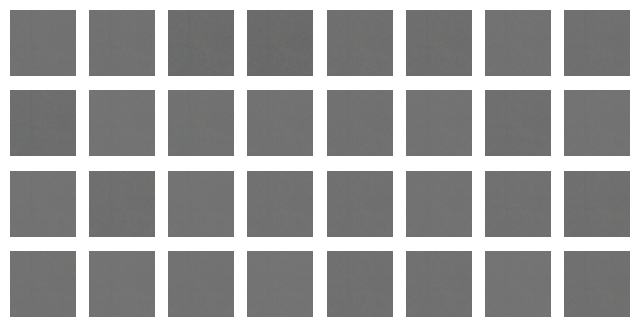

Epoch 2/25


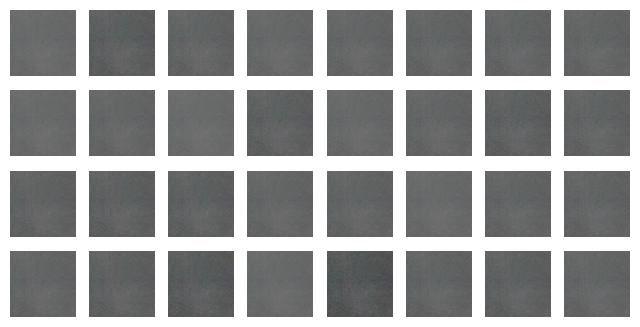

Epoch 3/25


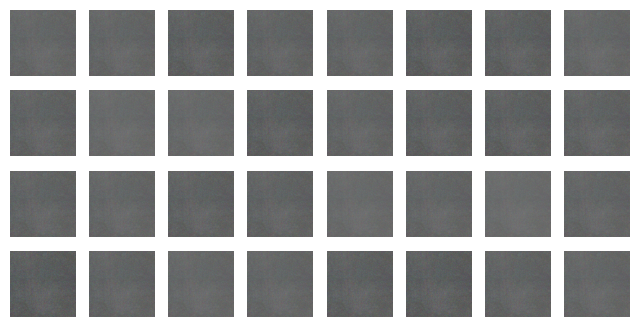

Epoch 4/25


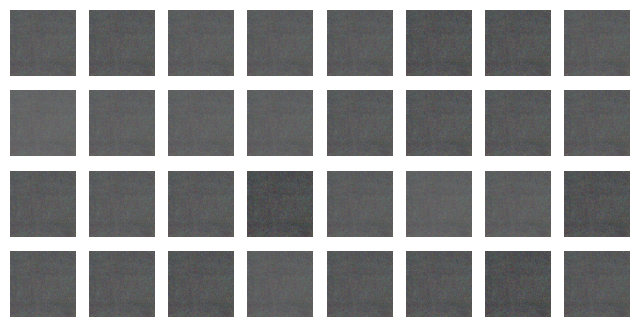

Epoch 5/25


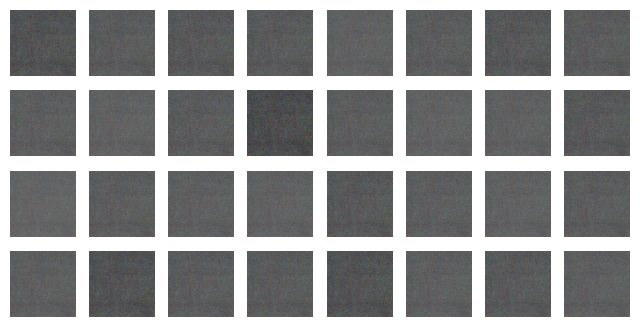

Epoch 6/25


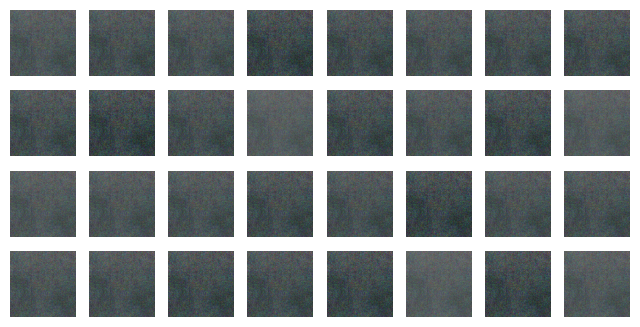

Epoch 7/25


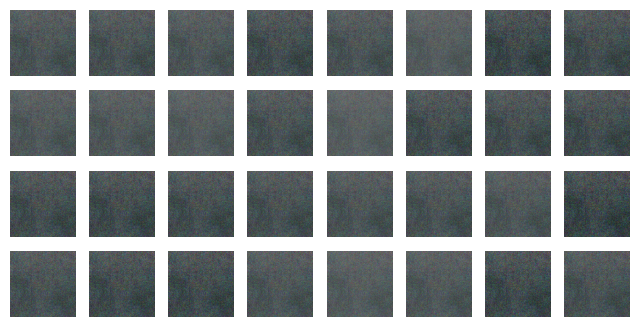

Epoch 8/25


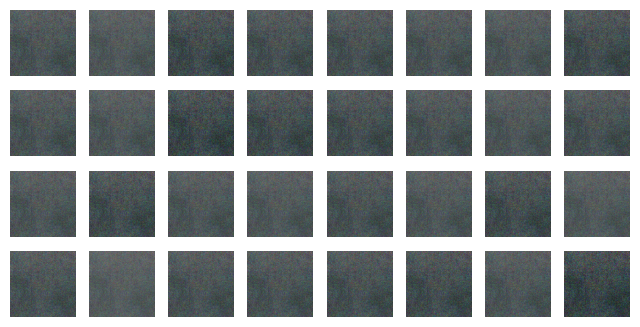

Epoch 9/25


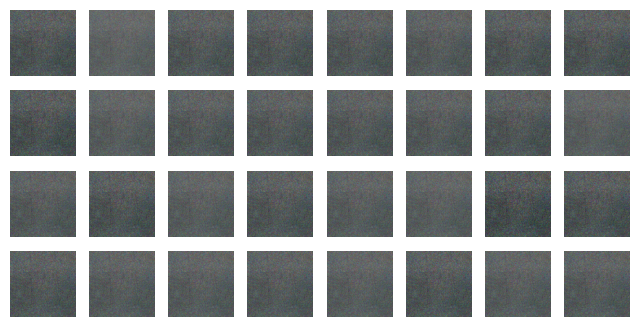

Epoch 10/25


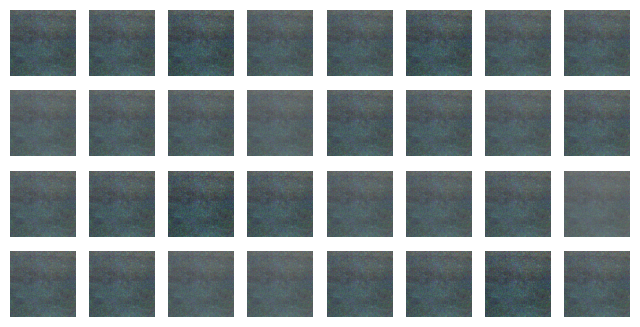

Epoch 11/25


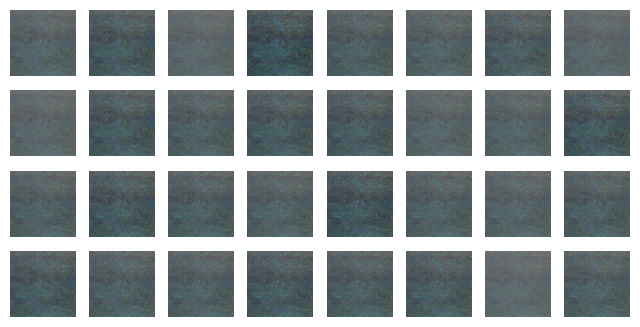

Epoch 12/25


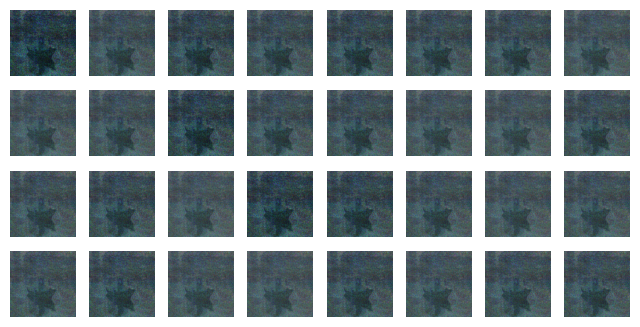

Epoch 13/25


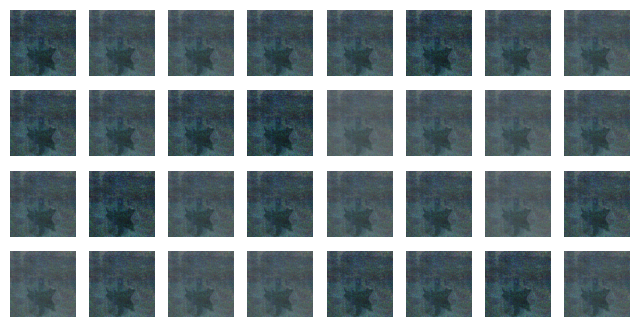

Epoch 14/25


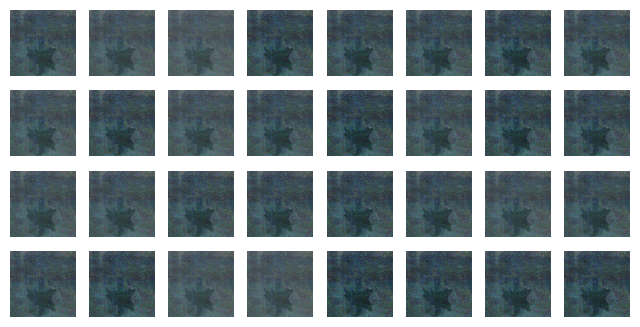

Epoch 15/25


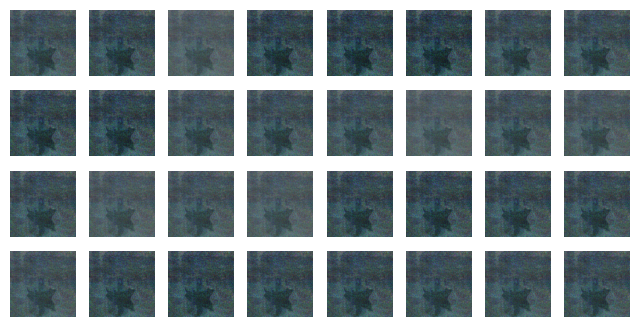

Epoch 16/25


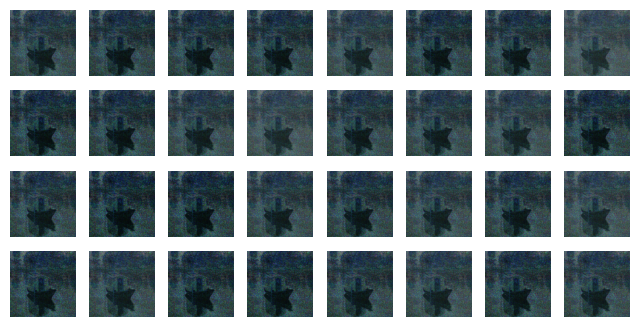

Epoch 17/25


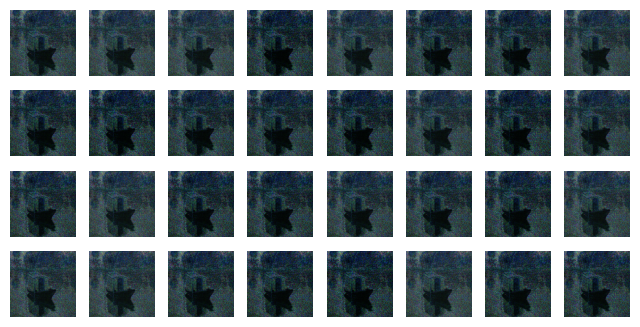

Epoch 18/25


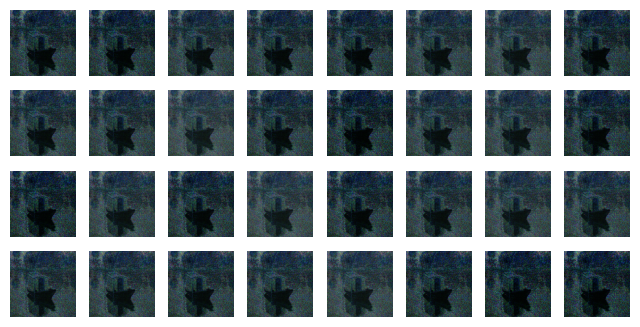

Epoch 19/25


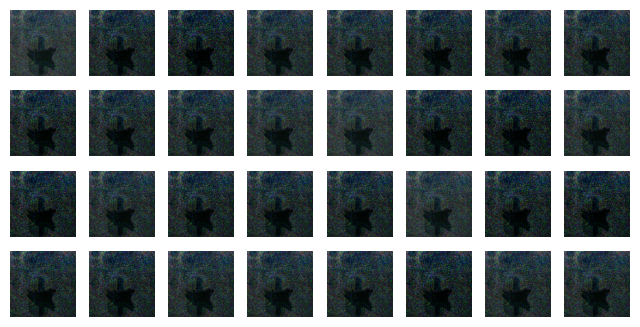

Epoch 20/25


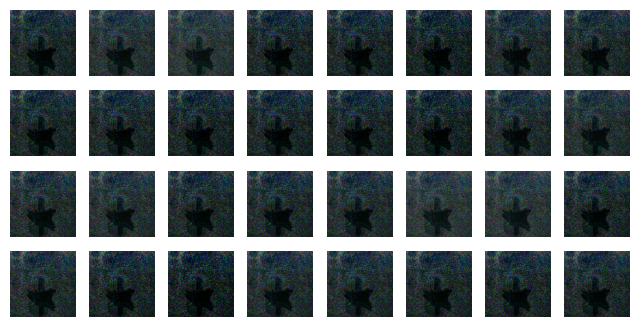

Epoch 21/25


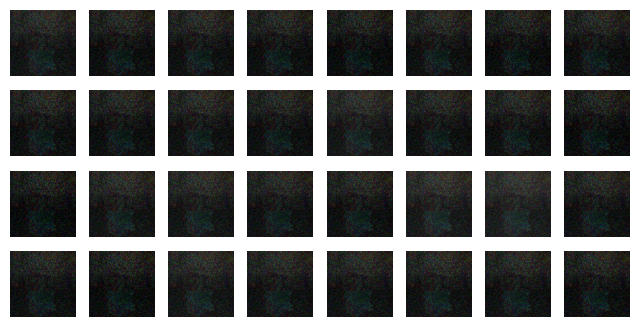

Epoch 22/25


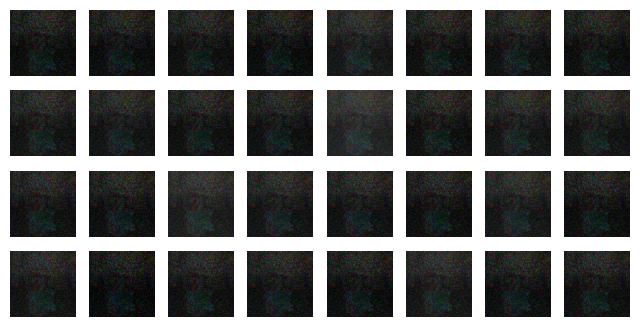

Epoch 23/25


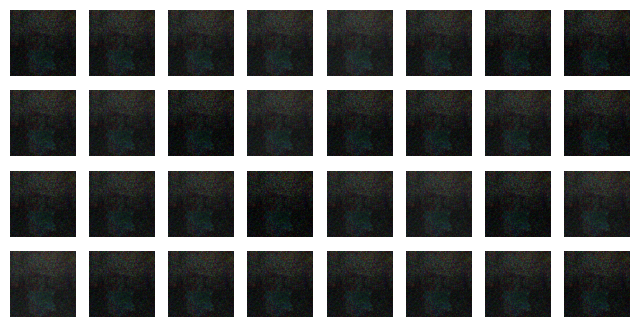

Epoch 24/25


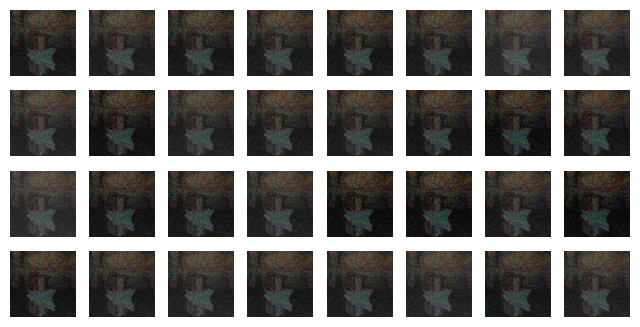

Epoch 25/25


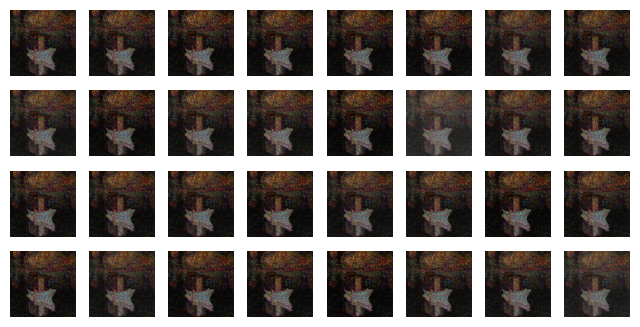

In [48]:
def train_gan(gan, dataset, batch_size, codings_size, n_epochs):
    generator, discriminator = gan.layers
    for epoch in range(n_epochs):
        print(f"Epoch {epoch + 1}/{n_epochs}")
        for X_batch in dataset:
            noise = tf.random.normal(shape=[batch_size, codings_size])
            generated_images = generator(noise)
            
            X_batch_float = tf.cast(X_batch, tf.float32)
            
            X_fake_and_real = tf.concat([generated_images, X_batch_float], axis=0)
            y1 = tf.constant([[0.]] * batch_size + [[1.]] * batch_size)
            discriminator.train_on_batch(X_fake_and_real, y1)
            
            noise = tf.random.normal(shape=[batch_size, codings_size])
            y2 = tf.constant([[1.]] * batch_size)
            gan.train_on_batch(noise, y2)
        
        plot_multiple_images(generated_images.numpy(), 8)
        plt.show()
train_gan(gan, dataset, batch_size, codings_size, n_epochs=25)

In [49]:
tf.random.set_seed(42)

codings = tf.random.normal(shape=[batch_size, codings_size])
generated_images = generator.predict(codings)

1/1 [==============================] - 0s 275ms/step


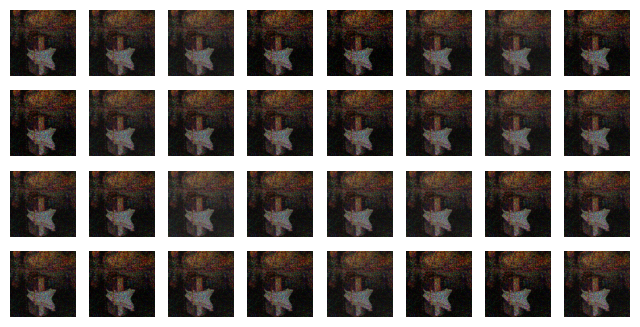

In [50]:
plot_multiple_images(generated_images, 8)


In [51]:
tf.random.set_seed(42) 
tf.keras.backend.clear_session()

codings_size = 100

generator = tf.keras.Sequential([
    tf.keras.layers.Dense(64 * 64 * 128),
    tf.keras.layers.Reshape([64, 64, 128]),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(64, kernel_size=5, strides=2,
                                    padding="same", activation="relu"),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(1, kernel_size=5, strides=2,
                                    padding="same", activation="tanh"),
])
discriminator = tf.keras.Sequential([
    tf.keras.layers.Conv2D(64, kernel_size=5, strides=2, padding="same",
                        activation=tf.keras.layers.LeakyReLU(0.2)),
    tf.keras.layers.Dropout(0.4),
    tf.keras.layers.Conv2D(128, kernel_size=5, strides=2, padding="same",
                        activation=tf.keras.layers.LeakyReLU(0.2)),
    tf.keras.layers.Dropout(0.4),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1, activation="sigmoid")
])
gan = tf.keras.Sequential([generator, discriminator])

In [52]:
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

In [53]:
X_train_dcgan = monet_images.reshape(-1, 256, 256, 1) * 2. - 1.


Epoch 1/25


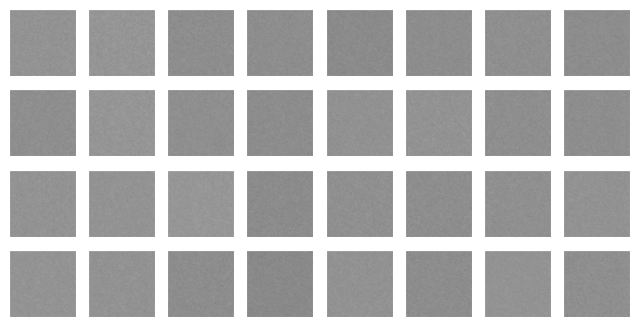

Epoch 2/25


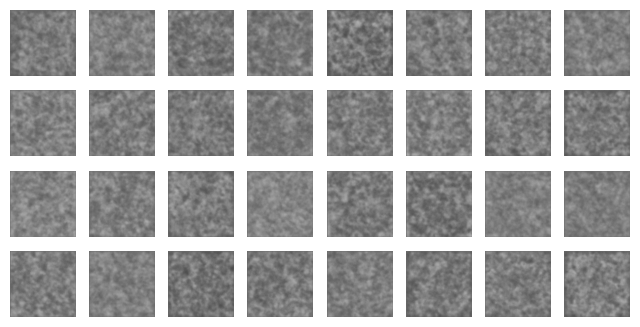

Epoch 3/25


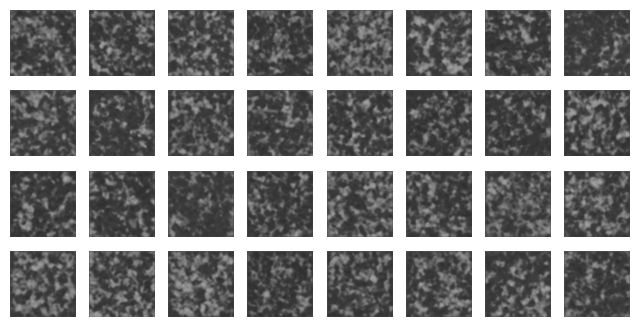

Epoch 4/25


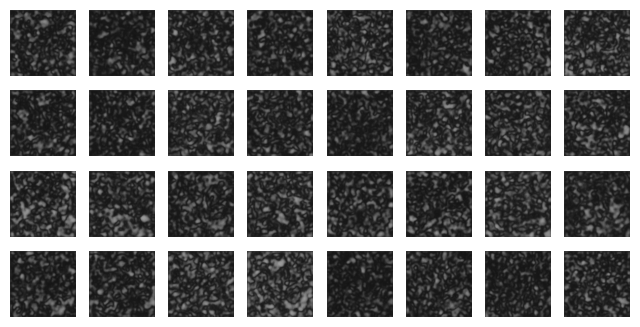

Epoch 5/25


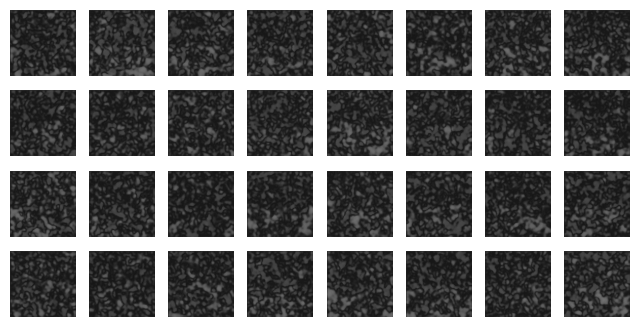

Epoch 6/25


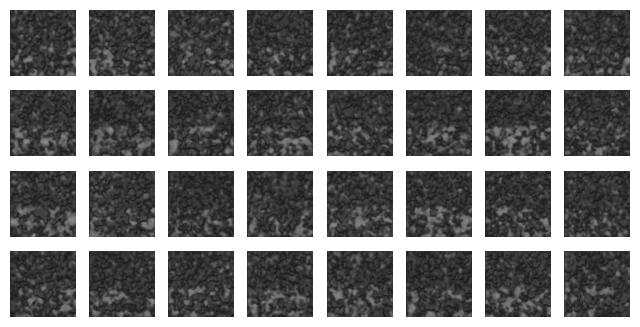

Epoch 7/25


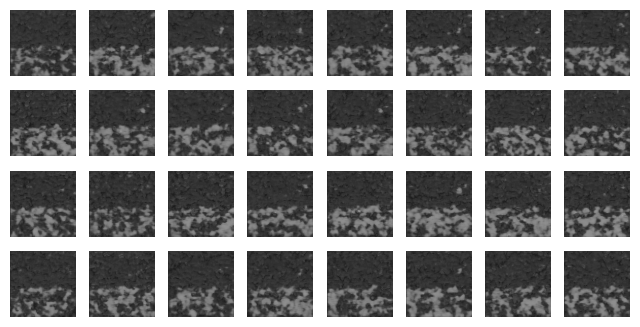

Epoch 8/25


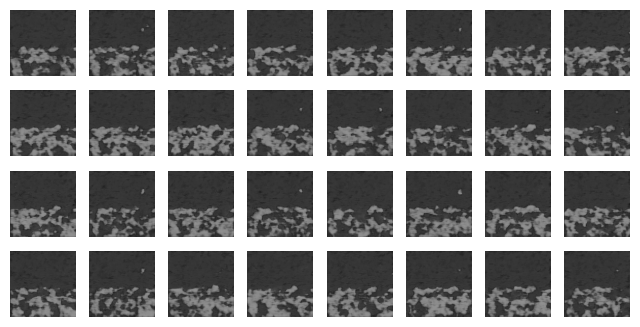

Epoch 9/25


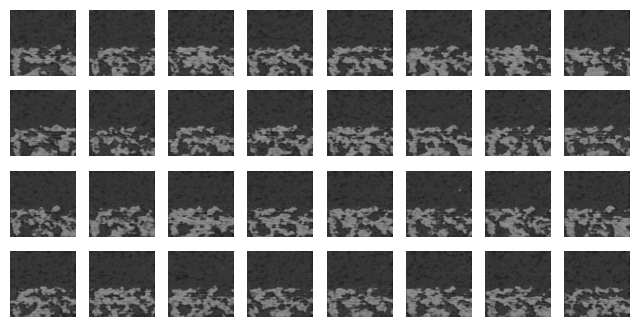

Epoch 10/25


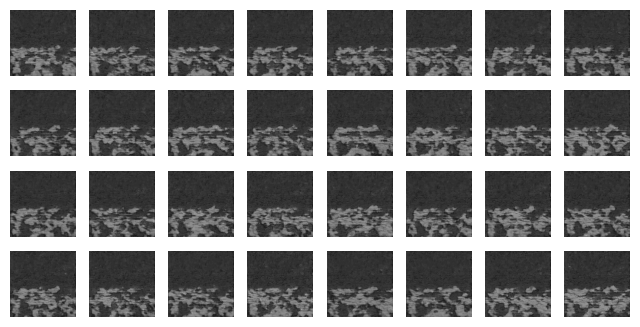

Epoch 11/25


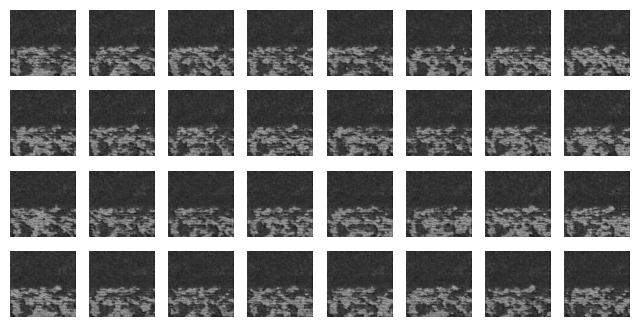

Epoch 12/25


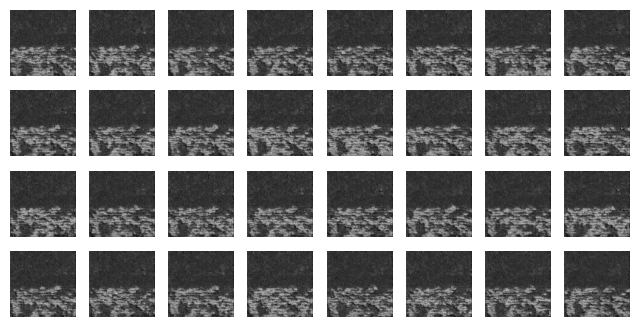

Epoch 13/25


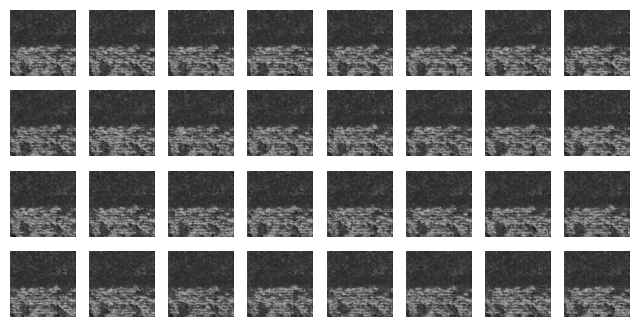

Epoch 14/25


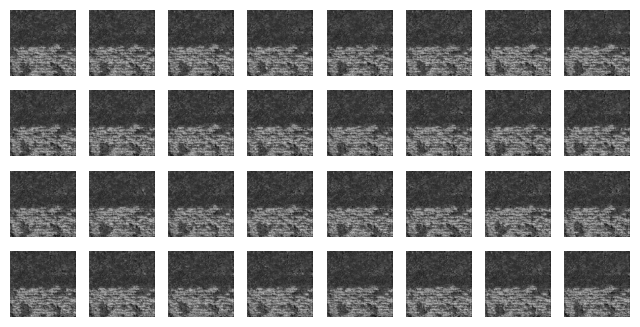

Epoch 15/25


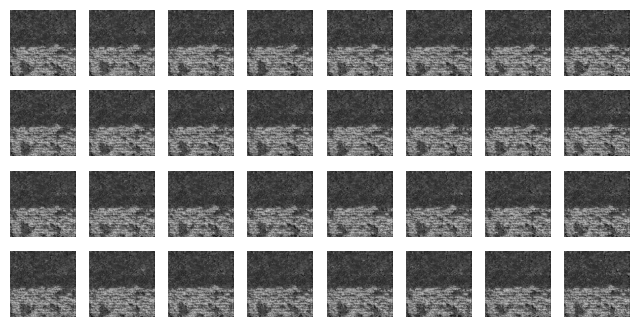

Epoch 16/25


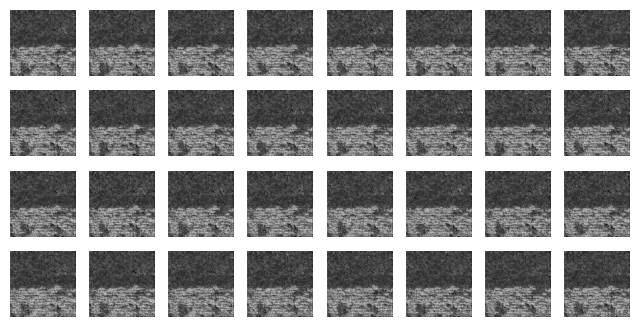

Epoch 17/25


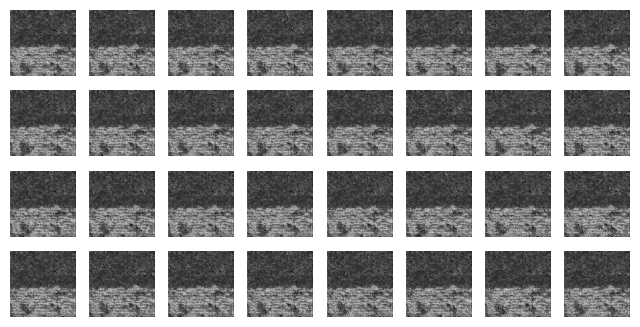

Epoch 18/25


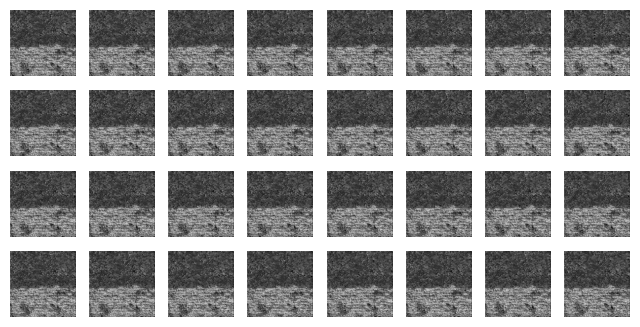

Epoch 19/25


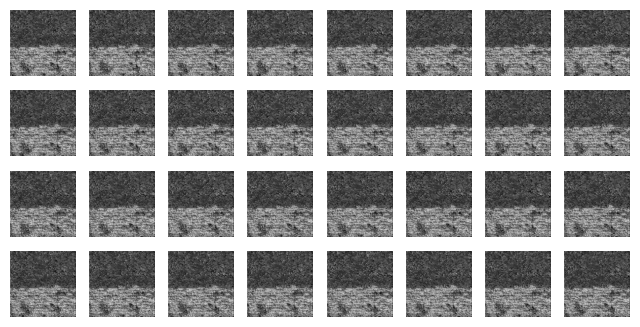

Epoch 20/25


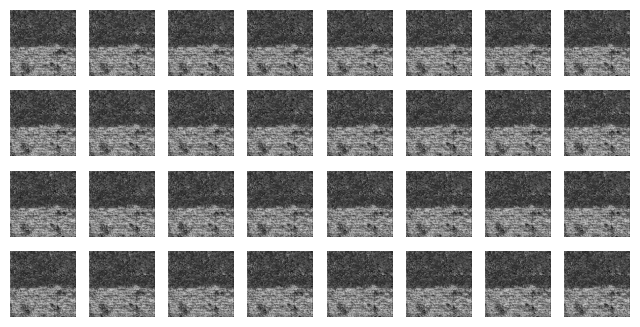

Epoch 21/25


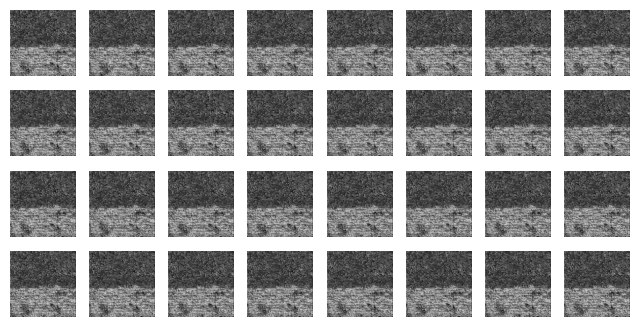

Epoch 22/25


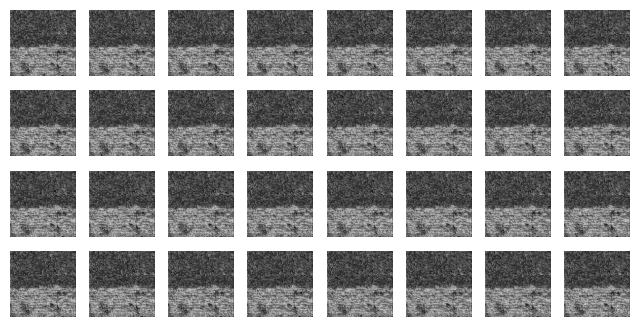

Epoch 23/25


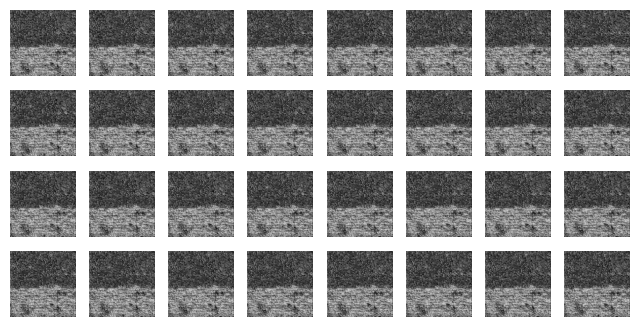

Epoch 24/25


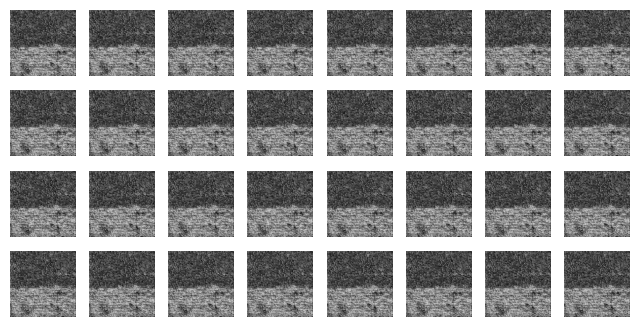

Epoch 25/25


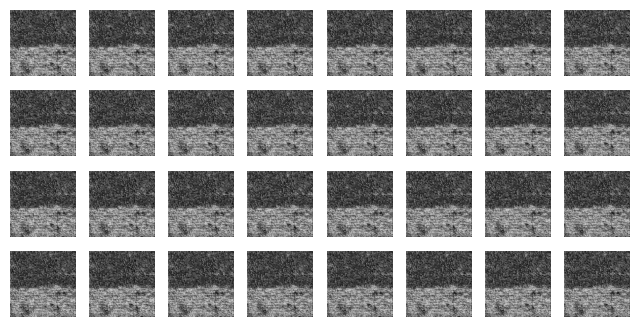

In [54]:
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train_dcgan)
dataset = dataset.shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)
train_gan(gan, dataset, batch_size, codings_size, n_epochs=25)